## Import Libraries

In [1]:
%%time
# code block 1
import zipfile
import tensorflow as tf
import numpy as np
import pandas as pd
import os
import numpy as np
import pandas as pd
import warnings
import warnings
warnings.filterwarnings("ignore", category=DeprecationWarning)
warnings.filterwarnings("ignore", category=FutureWarning)
warnings.filterwarnings("ignore")  # Ignore all warnings




CPU times: total: 2.42 s
Wall time: 10.5 s


## Import Data

In [2]:
# code block 2
# Extract the zip file
with zipfile.ZipFile('Flowers_data.zip', 'r') as zip_ref:
    zip_ref.extractall()


### Flower Image samples

Random samples for carnation:


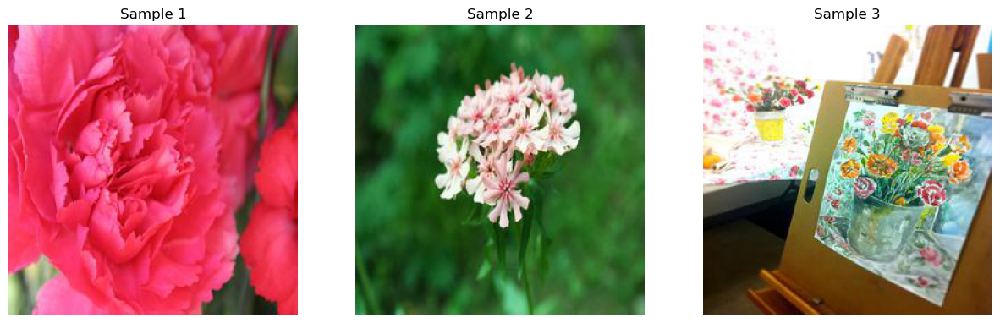

Random samples for iris:


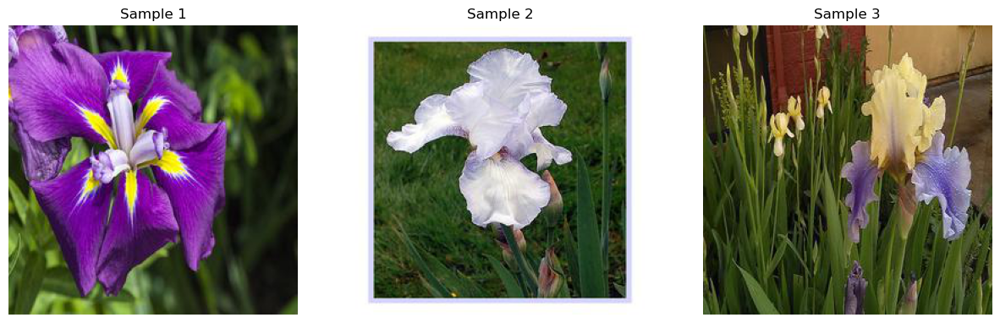

Random samples for bellflower:


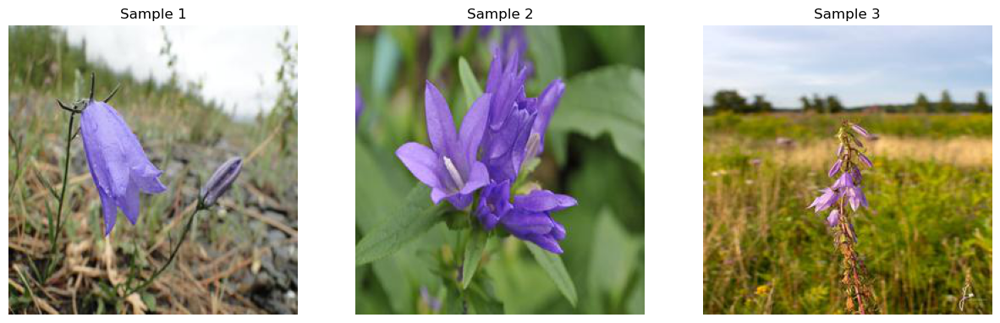

Random samples for california_poppy:


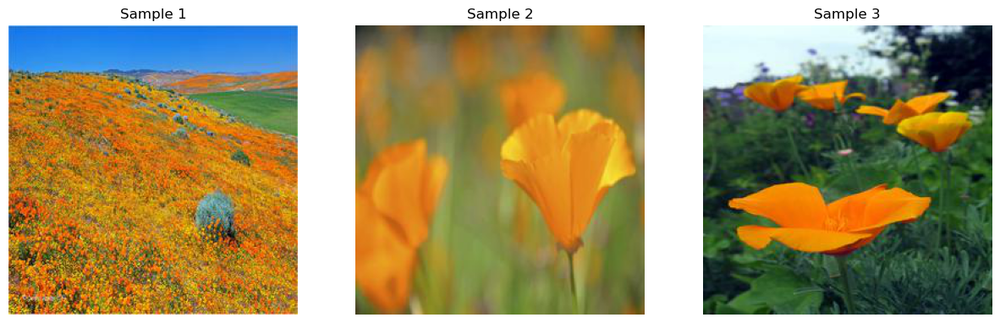

Random samples for rose:


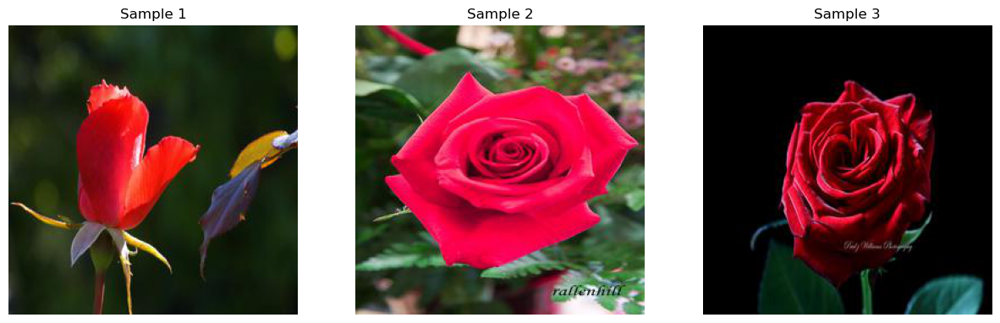

Random samples for astilbe:


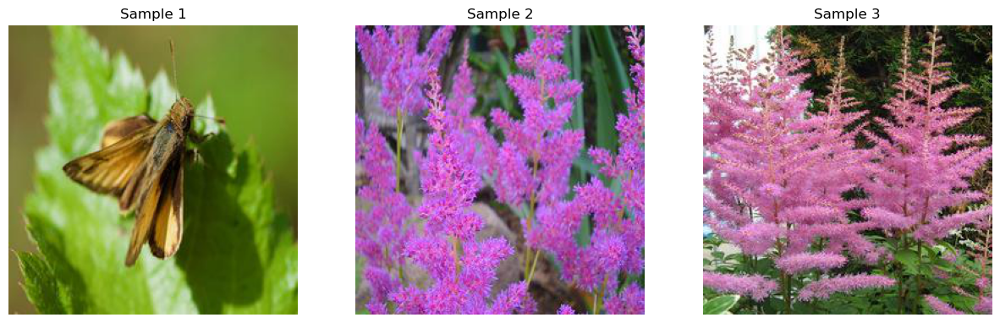

Random samples for tulip:


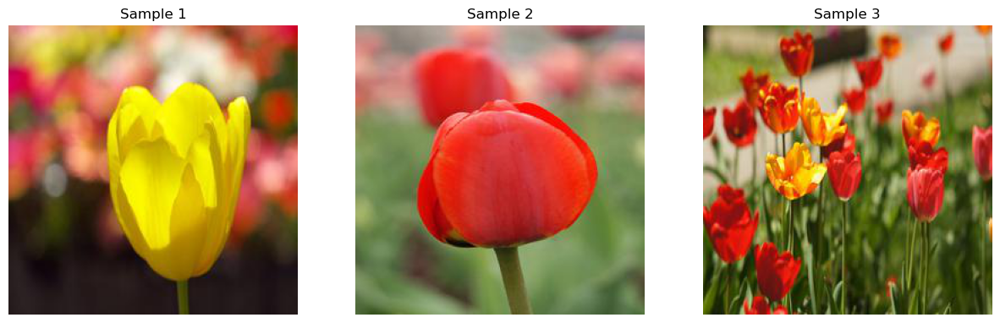

Random samples for calendula:


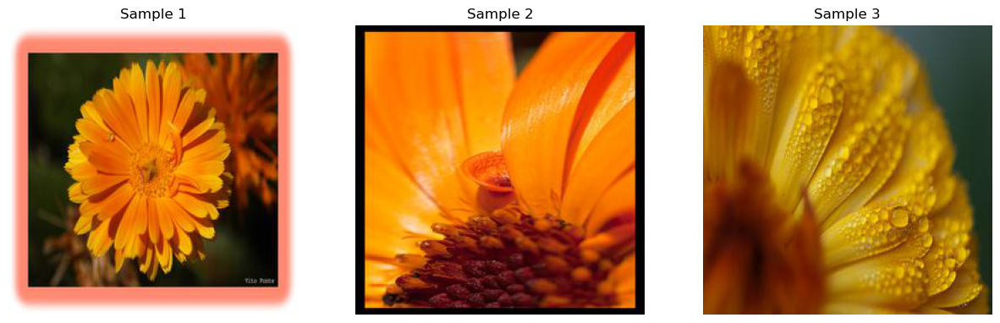

Random samples for dandelion:


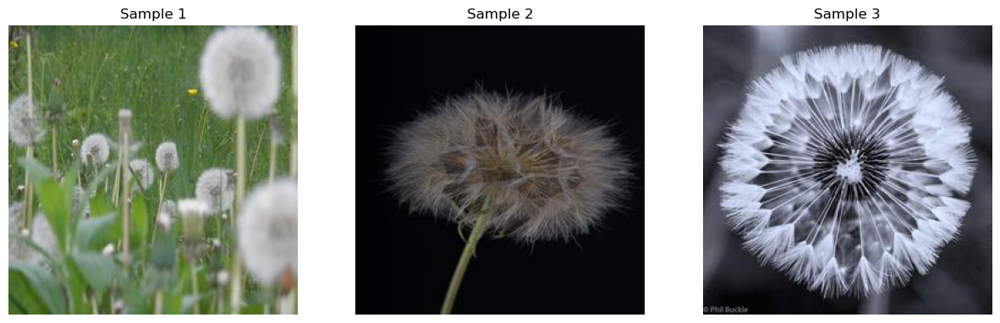

Random samples for coreopsis:


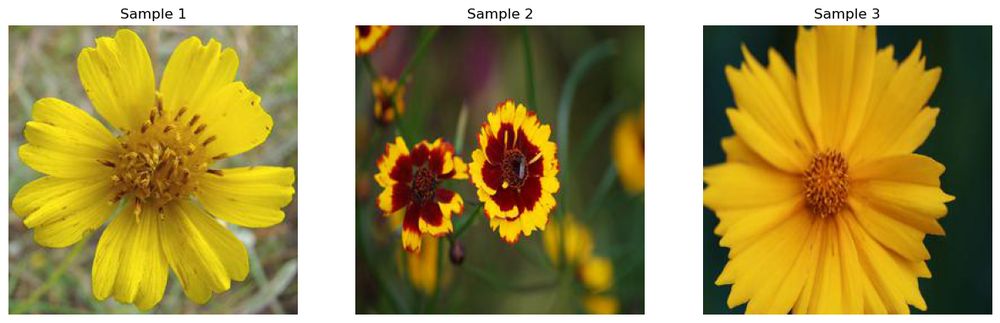

Random samples for black_eyed_susan:


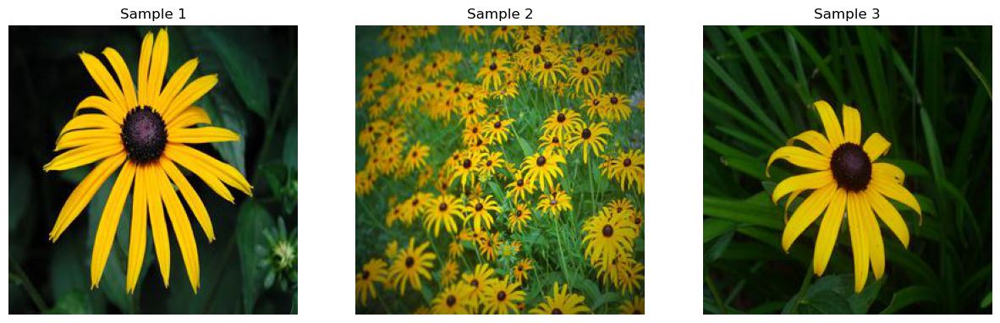

Random samples for water_lily:


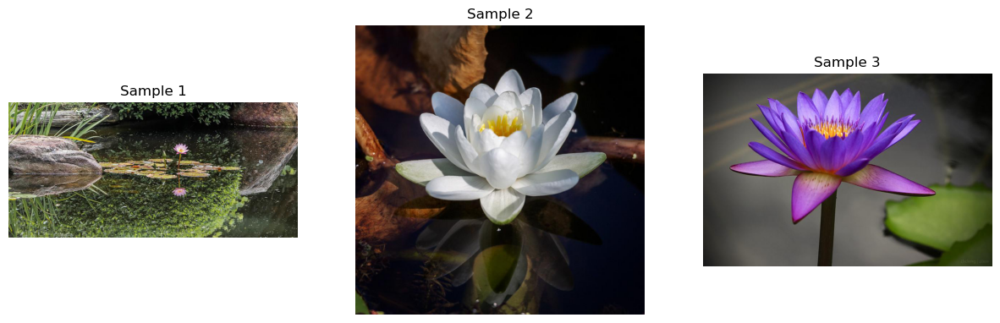

Random samples for sunflower:


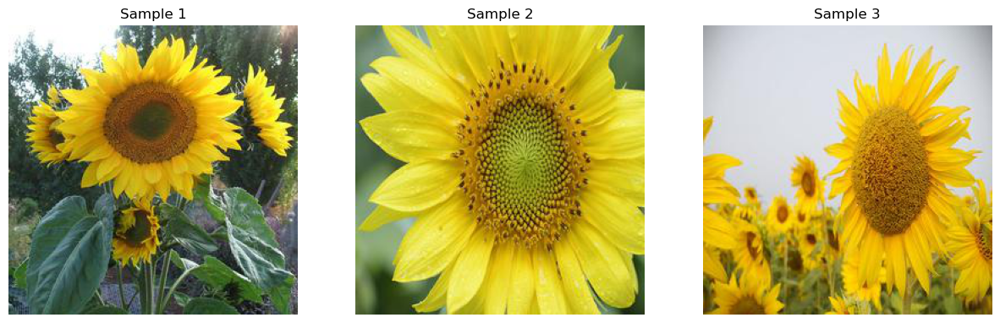

Random samples for common_daisy:


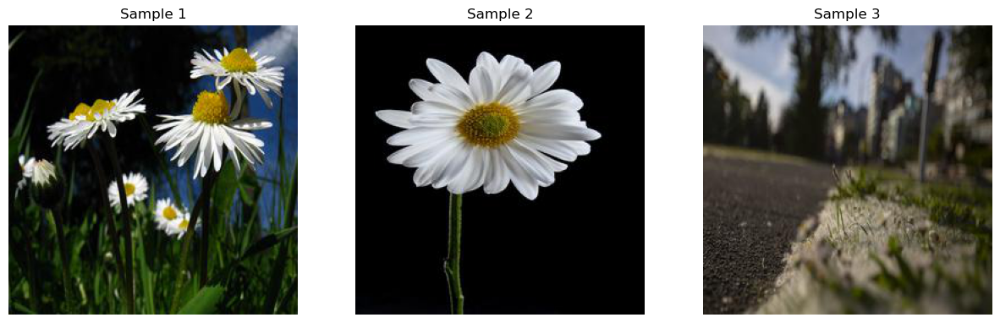

CPU times: total: 5.5 s
Wall time: 7.89 s


In [3]:
%%time
# code block 3 Check the flower types
import random
from PIL import Image
import os
import matplotlib.pyplot as plt
# Path to the directory containing the images
data_dir = 'Flowers_Data/Flowers_Data/train/'

# List of flower names
flower_names = [
    'carnation', 'iris', 'bellflower', 'california_poppy', 'rose', 'astilbe','tulip',
    'calendula', 'dandelion', 'coreopsis', 'black_eyed_susan', 'water_lily',
    'sunflower',  'common_daisy'
]

# Function to display random samples for each flower type
def display_random_samples(data_dir, flower_names, num_samples=3):
    for flower_name in flower_names:
        flower_path = os.path.join(data_dir, flower_name)
        flower_images = os.listdir(flower_path)
        random_samples = random.sample(flower_images, num_samples)

        print(f"Random samples for {flower_name}:")
        plt.figure(figsize=(15, 5))
        for i, image_name in enumerate(random_samples, 1):
            img_path = os.path.join(flower_path, image_name)
            img = Image.open(img_path)

            plt.subplot(1, num_samples, i)
            plt.imshow(img)
            plt.title(f"Sample {i}")
            plt.axis('off')

        plt.show()

# Display random samples for each flower type
display_random_samples(data_dir, flower_names, num_samples=3)

In [4]:
# code block 4
train_df = pd.read_csv('Flowers_Data/Flowers_Data/train.csv')
val_df = pd.read_csv('Flowers_Data/Flowers_Data/val.csv')


In [5]:
# code block 5
train_df.head()

,image:FILE,category
0,train/carnation/6838762136_f8254d6a1a_c.jpg,0
1,train/carnation/3540544866_823aee81af_c.jpg,0
2,train/carnation/50034862576_b0f55b7b3b_c.jpg,0
3,train/carnation/26770795691_f662e47143_c.jpg,0
4,train/carnation/18224456534_2f75191d85_c.jpg,0


## Process the data

In [6]:
# code block 6
# Load the flower images
train_images = []
val_images = []

In [7]:
# code block 7
def load_image(image_path):
    # Read image as uint8
    image = tf.io.read_file(image_path)

    # Decode JPEG image
    image = tf.image.decode_jpeg(image, channels=3)

    # Resize image to a fixed size
    image = tf.image.resize(image, (128, 128))

    # Normalize image values to [0, 1]
    image = tf.cast(image, tf.float32) / 255.0

    return image

def augment_image(image):
    # Random horizontal flip
    image = tf.image.random_flip_left_right(image)

    # Random crop
    image = tf.image.random_crop(image, [128, 128, 3])

    # Random brightness
    image = tf.image.random_brightness(image, max_delta=0.3)

    return image

In [8]:
# code block 8
# Create training dataset
# Corrected line: Use os.path.join to join directory and file paths
train_dataset = tf.data.Dataset.from_tensor_slices((
    train_df['image:FILE'].apply(lambda x: 'Flowers_Data/Flowers_Data/' + x), 
    train_df['category']
))

In [9]:
# code block 9
# Apply image loading and augmentation
train_dataset = train_dataset.map(lambda image, category: (augment_image(load_image(image)), category))

# Shuffle and batch the dataset
train_dataset = train_dataset.shuffle(buffer_size=10000).batch(32)

In [10]:
# code block 10
# Create validation dataset
val_dataset = tf.data.Dataset.from_tensor_slices((
    val_df['image:FILE'].apply(lambda x: 'Flowers_Data/Flowers_Data/' + x), 
    val_df['category']
))

# Apply image loading
val_dataset = val_dataset.map(lambda image, category: (load_image(image), category))

# Batch the dataset
val_dataset = val_dataset.batch(32)

### CNN Model

In [11]:
# code block 11
import tensorflow as tf
from tensorflow.keras import layers, models
from sklearn.model_selection import ParameterGrid

In [12]:
# code block 12
# Define the model
def build_model():
    model = models.Sequential([
        layers.Conv2D(32, (3, 3), activation='relu', input_shape=(128, 128, 3)),
        layers.MaxPooling2D((2, 2)),
        layers.Conv2D(64, (3, 3), activation='relu'),
        layers.MaxPooling2D((2, 2)),
        layers.Conv2D(128, (3, 3), activation='relu'),
        layers.MaxPooling2D((2, 2)),
        layers.Flatten(),
        layers.Dense(128, activation='relu'),
        layers.Dense(14, activation='softmax')  # Use softmax for multi-class classification
    ])
    return model

#### After running couple times, learning rate =0.01 could not generate good accuracy. I just dropped it.

In [13]:
# code block 13
%%time
param_grid = {
    'learning_rate': [0.001],
    'batch_size': [16, 32],
    'epochs': [10, 20]
}

grid = ParameterGrid(param_grid)

best_accuracy = 0
best_hyperparameters = {}

for params in grid:
    print(f"Training with hyperparameters: {params}")

    model = build_model()
    optimizer = tf.keras.optimizers.Adam(learning_rate=params['learning_rate'])
    model.compile(optimizer=optimizer,
                  loss='sparse_categorical_crossentropy',
                  metrics=['accuracy'])

    history = model.fit(train_dataset, epochs=params['epochs'], batch_size=params['batch_size'], validation_data=val_dataset)

    _, accuracy = model.evaluate(val_dataset)

    if accuracy > best_accuracy:
        best_accuracy = accuracy
        best_hyperparameters = params

print("Best Hyperparameters:", best_hyperparameters)


Training with hyperparameters: {'batch_size': 16, 'epochs': 10, 'learning_rate': 0.001}


Epoch 1/10


427/427 [==============================] - 127s 189ms/step - loss: 1.7143 - accuracy: 0.4062 - val_loss: 1.3563 - val_accuracy: 0.5408
Epoch 2/10
427/427 [==============================] - 118s 171ms/step - loss: 1.1983 - accuracy: 0.5823 - val_loss: 1.1298 - val_accuracy: 0.5714
Epoch 3/10
427/427 [==============================] - 114s 170ms/step - loss: 0.9578 - accuracy: 0.6662 - val_loss: 0.9161 - val_accuracy: 0.6531
Epoch 4/10
427/427 [==============================] - 120s 172ms/step - loss: 0.7911 - accuracy: 0.7240 - val_loss: 0.9194 - val_accuracy: 0.6735
Epoch 5/10
427/427 [==============================] - 119s 174ms/step - loss: 0.6549 - accuracy: 0.7718 - val_loss: 0.8073 - val_accuracy: 0.7041
Epoch 6/10
427/427 [==============================] - 114s 180ms/step - loss: 0.5380 - accuracy: 0.8184 - val_loss: 0.8153 - val_accuracy: 0.7347
Epoch 7/10
427/427 [============

Epoch 7/20
427/427 [==============================] - 135s 193ms/step - loss: 0.3830 - accuracy: 0.8727 - val_loss: 0.7555 - val_accuracy: 0.7143
Epoch 8/20
427/427 [==============================] - 139s 194ms/step - loss: 0.3126 - accuracy: 0.8968 - val_loss: 0.8938 - val_accuracy: 0.6837
Epoch 9/20
427/427 [==============================] - 137s 193ms/step - loss: 0.2457 - accuracy: 0.9203 - val_loss: 0.8566 - val_accuracy: 0.7041
Epoch 10/20
427/427 [==============================] - 139s 193ms/step - loss: 0.1899 - accuracy: 0.9400 - val_loss: 0.9806 - val_accuracy: 0.7449
Epoch 11/20
427/427 [==============================] - 140s 194ms/step - loss: 0.1589 - accuracy: 0.9483 - val_loss: 0.9606 - val_accuracy: 0.7653
Epoch 12/20
427/427 [==============================] - 132s 184ms/step - loss: 0.1388 - accuracy: 0.9532 - val_loss: 1.0258 - val_accuracy: 0.7143
Epoch 13/20
427/427 [==============================] - 138s 191ms/step - loss: 0.1153 - accuracy: 0.9631 - val_loss: 1.05

### After running, I got best hyperparameters, but it would be changeable when run couple times, acutually, I got better results with epochs:20.

In [14]:
# code block 14
%%time
# Define the best hyperparameters
best_hyperparameters = {'batch_size': 32, 'epochs': 10, 'learning_rate': 0.001}

CPU times: total: 0 ns
Wall time: 0 ns


In [15]:
# code block 15
%%time
final_model = build_model()
final_optimizer = tf.keras.optimizers.Adam(learning_rate=best_hyperparameters['learning_rate'])
final_model.compile(optimizer=final_optimizer,
                    loss='sparse_categorical_crossentropy',  # Use sparse categorical crossentropy for integer labels
                    metrics=['accuracy'])

final_history = final_model.fit(train_dataset, epochs=best_hyperparameters['epochs'], batch_size=best_hyperparameters['batch_size'], validation_data=val_dataset)

Epoch 1/10
427/427 [==============================] - 139s 188ms/step - loss: 1.6466 - accuracy: 0.4252 - val_loss: 1.2948 - val_accuracy: 0.5408
Epoch 2/10
427/427 [==============================] - 140s 198ms/step - loss: 1.1471 - accuracy: 0.6041 - val_loss: 0.9497 - val_accuracy: 0.5918
Epoch 3/10
427/427 [==============================] - 132s 197ms/step - loss: 0.8934 - accuracy: 0.6923 - val_loss: 0.7605 - val_accuracy: 0.7041
Epoch 4/10
427/427 [==============================] - 142s 197ms/step - loss: 0.7098 - accuracy: 0.7566 - val_loss: 0.8038 - val_accuracy: 0.6837
Epoch 5/10
427/427 [==============================] - 140s 197ms/step - loss: 0.5734 - accuracy: 0.8033 - val_loss: 0.8011 - val_accuracy: 0.7347
Epoch 6/10
427/427 [==============================] - 141s 197ms/step - loss: 0.4407 - accuracy: 0.8450 - val_loss: 0.7903 - val_accuracy: 0.7245
Epoch 7/10
427/427 [==============================] - 140s 197ms/step - loss: 0.3500 - accuracy: 0.8861 - val_loss: 0.7997 -

### Evaluate on Validation dataset

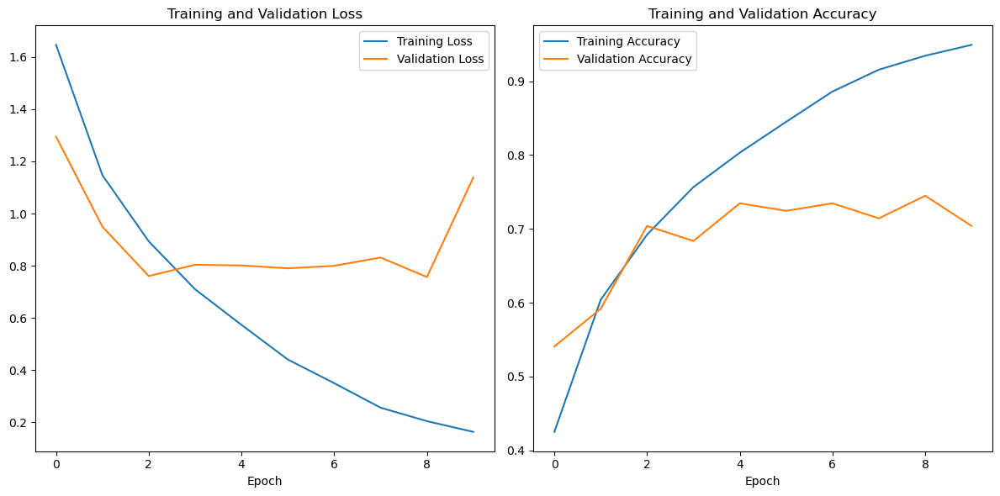

CPU times: total: 422 ms
Wall time: 448 ms


In [16]:
# code block 16
%%time
import matplotlib.pyplot as plt
# Plot training and validation loss
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.plot(final_history.history['loss'], label='Training Loss')
plt.plot(final_history.history['val_loss'], label='Validation Loss')
plt.legend()
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')

# Plot training and validation accuracy
plt.subplot(1, 2, 2)
plt.plot(final_history.history['accuracy'], label='Training Accuracy')
plt.plot(final_history.history['val_accuracy'], label='Validation Accuracy')
plt.legend()
plt.title('Training and Validation Accuracy')
plt.xlabel('Epoch')

plt.tight_layout()
plt.show()

In [18]:
# code block 17
# Evaluate the final model on the validation dataset
validation_loss, validation_accuracy = final_model.evaluate(val_dataset)
print(f'Validation Loss: {validation_loss:.4f}')
print(f'Validation Accuracy: {validation_accuracy:.4f}')

4/4 [==============================] - 0s 32ms/step - loss: 1.1380 - accuracy: 0.7041
Validation Loss: 1.1380
Validation Accuracy: 0.7041


### Explanation
- Upon reviewing the plots and results, a notable trend emerges— the training accuracy exhibits a substantial improvement, rising from 42.52% in the initial epoch to an impressive 94.93% by the tenth epoch. This upward trajectory signifies effective learning from the training dataset.
- However, a less favorable observation pertains to the validation accuracy, which demonstrates fluctuations and registers at 70.41% in the concluding epoch. This variability raises concerns about potential overfitting to the training data or the existence of other underlying issues.
- To address this, I am contemplating a more in-depth exploration into hyperparameter tuninglater. This investigation aims to refine the model's configuration, potentially mitigating overfitting and enhancing overall performance.

In [19]:
# code block 18
true_labels = []

for batch in val_dataset:
    true_labels.extend(batch[1].numpy())  # Assuming labels are in the second element of each batch

true_labels = tf.convert_to_tensor(true_labels)

In [20]:
# codeblock 19
predicted_probs = final_model.predict(val_dataset)
predicted_labels = tf.argmax(predicted_probs, axis=1)

4/4 [==============================] - 0s 44ms/step


In [21]:
# code block 20
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

# Convert predicted_labels to a NumPy array
predicted_labels = predicted_labels.numpy()

# Compute metrics
accuracy = accuracy_score(true_labels, predicted_labels)
precision = precision_score(true_labels, predicted_labels, average='weighted')
recall = recall_score(true_labels, predicted_labels, average='weighted')
f1 = f1_score(true_labels, predicted_labels, average='weighted')

# Print or use the computed metrics as needed
print(f'Accuracy: {accuracy}')
print(f'Precision: {precision}')
print(f'Recall: {recall}')
print(f'F1-score: {f1}')

Accuracy: 0.7040816326530612
Precision: 0.7271722325293752
Recall: 0.7040816326530612
F1-score: 0.6941871620443048


In [22]:
# code block 21
from sklearn.metrics import classification_report

# Assuming true_labels and predicted_labels are NumPy arrays
print("\nClassification Report:")
print(classification_report(true_labels, predicted_labels))


Classification Report:
              precision    recall  f1-score   support

           0       0.50      0.57      0.53         7
           1       0.67      0.86      0.75         7
           2       0.62      0.71      0.67         7
           3       0.67      0.57      0.62         7
           4       0.67      0.86      0.75         7
           5       1.00      0.43      0.60         7
           6       0.67      0.86      0.75         7
           7       0.71      0.71      0.71         7
           8       0.86      0.86      0.86         7
           9       0.67      0.29      0.40         7
          10       0.64      1.00      0.78         7
          11       0.80      0.57      0.67         7
          12       1.00      0.86      0.92         7
          13       0.71      0.71      0.71         7

    accuracy                           0.70        98
   macro avg       0.73      0.70      0.69        98
weighted avg       0.73      0.70      0.69        98



In [23]:
# code block 22
classes = sorted(set(true_labels.numpy()))

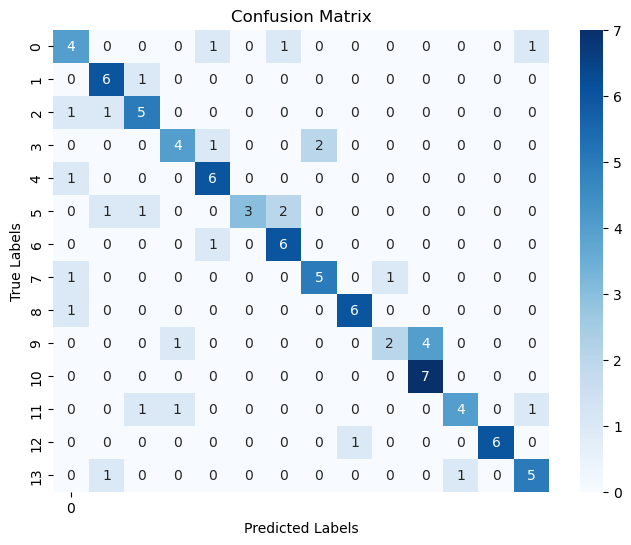

In [24]:
# code block23
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming true_labels and predicted_labels are NumPy arrays
conf_matrix = confusion_matrix(true_labels, predicted_labels)

# Plot the confusion matrix using seaborn
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=14, yticklabels=classes)
plt.title('Confusion Matrix')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.show()

In [25]:
# code block 24
from sklearn.metrics import cohen_kappa_score
# Kappa Coefficient
kappa = cohen_kappa_score(true_labels, predicted_labels)
print("\nKappa Coefficient:", kappa)


Kappa Coefficient: 0.6813186813186813


In [26]:
# code block 25
from sklearn.metrics import mean_squared_error
# Mean Squared Error
mse = mean_squared_error(true_labels, predicted_labels)
print("\nMean Squared Error:", mse)


Mean Squared Error: 7.928571428571429


### Transfer Learning / Inceptionv3

In [27]:
# code block 26
from tensorflow import keras
from tensorflow.keras.applications.inception_v3 import InceptionV3
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, Flatten, MaxPooling2D, Dense, Dropout, GlobalAveragePooling2D
from tensorflow.keras import optimizers, losses
from tensorflow.keras.callbacks import ModelCheckpoint
from tensorflow.keras.preprocessing import image

import pickle

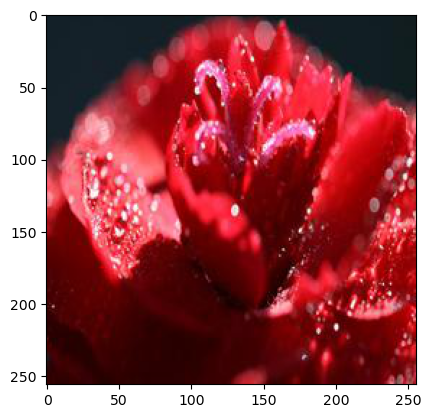

In [28]:
# code block 27
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import os

first_image_name = train_df.iloc[0]['image:FILE']
img_path = os.path.join('Flowers_Data/Flowers_Data', first_image_name)

img = mpimg.imread(img_path)
plt.imshow(img)
plt.show()

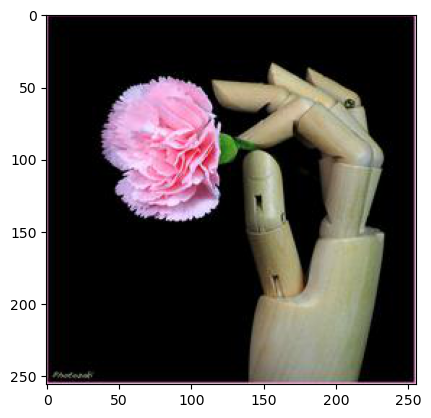

In [29]:
# code block28
first_image_name = val_df.iloc[0]['image:FILE']
img_path = os.path.join('Flowers_Data/Flowers_Data', first_image_name)

img = mpimg.imread(img_path)
plt.imshow(img)
plt.show()

In [30]:
# code block 29
img_width, img_height = 128, 128
batch_size = 64

### Load Images for training and testing

In [31]:
# code block 30
train_data_dir = 'Flowers_Data/Flowers_Data/train/'

In [32]:
# code block 31
train_data_dir = 'Flowers_Data/Flowers_Data/train/'  
# validation_data_dir = 'Flowers_Data/Flowers_Data/val/'

train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=40,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest',
    validation_split=0.2  # 
)

In [33]:
# code block 32
# Flow training images in batches using train_datagen generator
train_generator = train_datagen.flow_from_directory(
    train_data_dir,
    target_size=(img_width, img_height),
    batch_size=batch_size,
    class_mode='categorical',
    subset='training'  # Set as training data
)

# Flow validation images in batches using train_datagen generator
validation_generator = train_datagen.flow_from_directory(
    train_data_dir,  # Same directory as training data
    target_size=(img_width, img_height),
    batch_size=batch_size,
    class_mode='categorical',
    subset='validation'  # Set as validation data
)


Found 10919 images belonging to 14 classes.
Found 2723 images belonging to 14 classes.


In [34]:
# code block 33
# Load the InceptionV3 model without the top (fully connected) layers
base_model = InceptionV3(weights='imagenet', include_top=False, input_shape=(img_width, img_height, 3))

# Freeze the layers of the pre-trained model
for layer in base_model.layers:
    layer.trainable = False


In [35]:
# code block34
# Add a global spatial average pooling layer
x = base_model.output
x = GlobalAveragePooling2D()(x)


In [36]:
# code block 35
from tensorflow.keras.models import Model
# Add a fully connected layer with 256 neurons and ReLU activation
x = Dense(256, activation='relu')(x)

# Add the output layer with the number of classes and softmax activation
predictions = Dense(14, activation='softmax')(x)

# Create the final model
model = Model(inputs=base_model.input, outputs=predictions)

In [39]:
# code block36
%%time
 
from tensorflow.keras.optimizers import Adam
# Compile the model
model.compile(optimizer=Adam(lr=0.001), loss='categorical_crossentropy', metrics=['accuracy'])

# Print the model summary
model.summary()

# Train the model
history = model.fit(
    train_generator,
    epochs=10,
    validation_data=validation_generator
)

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 150, 150, 3)]        0         []                            
                                                                                                  
 conv2d_15 (Conv2D)          (None, 74, 74, 32)           864       ['input_1[0][0]']             
                                                                                                  
 batch_normalization (Batch  (None, 74, 74, 32)           96        ['conv2d_15[0][0]']           
 Normalization)                                                                                   
                                                                                                  
 activation (Activation)     (None, 74, 74, 32)           0         ['batch_normalization[0][0

 conv2d_26 (Conv2D)          (None, 16, 16, 32)           6144      ['average_pooling2d[0][0]']   
                                                                                                  
 batch_normalization_5 (Bat  (None, 16, 16, 64)           192       ['conv2d_20[0][0]']           
 chNormalization)                                                                                 
                                                                                                  
 batch_normalization_7 (Bat  (None, 16, 16, 64)           192       ['conv2d_22[0][0]']           
 chNormalization)                                                                                 
                                                                                                  
 batch_normalization_10 (Ba  (None, 16, 16, 96)           288       ['conv2d_25[0][0]']           
 tchNormalization)                                                                                
          

                                                                                                  
 activation_17 (Activation)  (None, 16, 16, 96)           0         ['batch_normalization_17[0][0]
                                                                    ']                            
                                                                                                  
 activation_18 (Activation)  (None, 16, 16, 64)           0         ['batch_normalization_18[0][0]
                                                                    ']                            
                                                                                                  
 mixed1 (Concatenate)        (None, 16, 16, 288)          0         ['activation_12[0][0]',       
                                                                     'activation_14[0][0]',       
                                                                     'activation_17[0][0]',       
          

                                                                                                  
 conv2d_43 (Conv2D)          (None, 16, 16, 96)           55296     ['activation_27[0][0]']       
                                                                                                  
 batch_normalization_28 (Ba  (None, 16, 16, 96)           288       ['conv2d_43[0][0]']           
 tchNormalization)                                                                                
                                                                                                  
 activation_28 (Activation)  (None, 16, 16, 96)           0         ['batch_normalization_28[0][0]
                                                                    ']                            
                                                                                                  
 conv2d_41 (Conv2D)          (None, 7, 7, 384)            995328    ['mixed2[0][0]']              
          

 conv2d_45 (Conv2D)          (None, 7, 7, 192)            147456    ['mixed3[0][0]']              
                                                                                                  
 conv2d_48 (Conv2D)          (None, 7, 7, 192)            172032    ['activation_32[0][0]']       
                                                                                                  
 conv2d_53 (Conv2D)          (None, 7, 7, 192)            172032    ['activation_37[0][0]']       
                                                                                                  
 conv2d_54 (Conv2D)          (None, 7, 7, 192)            147456    ['average_pooling2d_3[0][0]'] 
                                                                                                  
 batch_normalization_30 (Ba  (None, 7, 7, 192)            576       ['conv2d_45[0][0]']           
 tchNormalization)                                                                                
          

                                                                    ']                            
                                                                                                  
 average_pooling2d_4 (Avera  (None, 7, 7, 768)            0         ['mixed4[0][0]']              
 gePooling2D)                                                                                     
                                                                                                  
 conv2d_55 (Conv2D)          (None, 7, 7, 192)            147456    ['mixed4[0][0]']              
                                                                                                  
 conv2d_58 (Conv2D)          (None, 7, 7, 192)            215040    ['activation_42[0][0]']       
                                                                                                  
 conv2d_63 (Conv2D)          (None, 7, 7, 192)            215040    ['activation_47[0][0]']       
          

                                                                                                  
 activation_52 (Activation)  (None, 7, 7, 160)            0         ['batch_normalization_52[0][0]
                                                                    ']                            
                                                                                                  
 activation_57 (Activation)  (None, 7, 7, 160)            0         ['batch_normalization_57[0][0]
                                                                    ']                            
                                                                                                  
 average_pooling2d_5 (Avera  (None, 7, 7, 768)            0         ['mixed5[0][0]']              
 gePooling2D)                                                                                     
                                                                                                  
 conv2d_65

 batch_normalization_62 (Ba  (None, 7, 7, 192)            576       ['conv2d_77[0][0]']           
 tchNormalization)                                                                                
                                                                                                  
 batch_normalization_67 (Ba  (None, 7, 7, 192)            576       ['conv2d_82[0][0]']           
 tchNormalization)                                                                                
                                                                                                  
 activation_62 (Activation)  (None, 7, 7, 192)            0         ['batch_normalization_62[0][0]
                                                                    ']                            
                                                                                                  
 activation_67 (Activation)  (None, 7, 7, 192)            0         ['batch_normalization_67[0][0]
          

                                                                                                  
 conv2d_86 (Conv2D)          (None, 3, 3, 320)            552960    ['activation_70[0][0]']       
                                                                                                  
 conv2d_90 (Conv2D)          (None, 3, 3, 192)            331776    ['activation_74[0][0]']       
                                                                                                  
 batch_normalization_71 (Ba  (None, 3, 3, 320)            960       ['conv2d_86[0][0]']           
 tchNormalization)                                                                                
                                                                                                  
 batch_normalization_75 (Ba  (None, 3, 3, 192)            576       ['conv2d_90[0][0]']           
 tchNormalization)                                                                                
          

                                                                                                  
 activation_82 (Activation)  (None, 3, 3, 384)            0         ['batch_normalization_82[0][0]
                                                                    ']                            
                                                                                                  
 activation_83 (Activation)  (None, 3, 3, 384)            0         ['batch_normalization_83[0][0]
                                                                    ']                            
                                                                                                  
 batch_normalization_84 (Ba  (None, 3, 3, 192)            576       ['conv2d_99[0][0]']           
 tchNormalization)                                                                                
                                                                                                  
 activatio

                                                                                                  
 activation_88 (Activation)  (None, 3, 3, 384)            0         ['batch_normalization_88[0][0]
                                                                    ']                            
                                                                                                  
 activation_91 (Activation)  (None, 3, 3, 384)            0         ['batch_normalization_91[0][0]
                                                                    ']                            
                                                                                                  
 activation_92 (Activation)  (None, 3, 3, 384)            0         ['batch_normalization_92[0][0]
                                                                    ']                            
                                                                                                  
 batch_nor

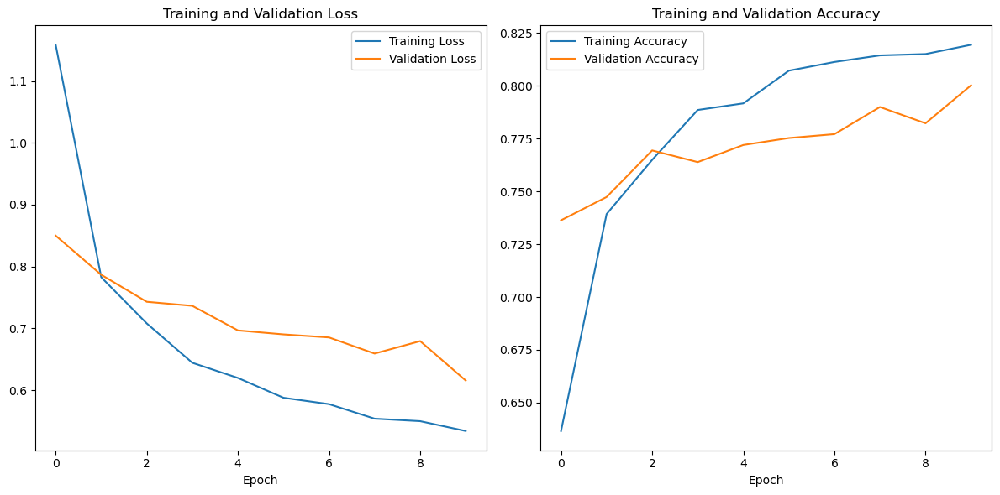

In [38]:
# code block 37
import matplotlib.pyplot as plt
# Plot training and validation loss
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.legend()
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')

# Plot training and validation accuracy
plt.subplot(1, 2, 2)
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.legend()
plt.title('Training and Validation Accuracy')
plt.xlabel('Epoch')

plt.tight_layout()
plt.show() 

In [40]:
# code block 38
# Evaluate the model on the validation data
val_loss, val_accuracy = model.evaluate(validation_generator)

# Print the validation loss and accuracy
print(f'Validation Loss: {val_loss:.4f}')
print(f'Validation Accuracy: {val_accuracy:.4f}')

43/43 [==============================] - 35s 804ms/step - loss: 0.6491 - accuracy: 0.7991
Validation Loss: 0.6491
Validation Accuracy: 0.7991


- The training accuracy steadily increases from 81.52% in the first epoch to 84.35% in the tenth epoch, The training loss decreases over epochsindicating the model is learning from the training data.
- The validation accuracy is relatively high, reaching 79.91%, suggesting that the model generalizes well to unseen flower images.The validation loss is reasonable, indicating that the model is not overfitting to the training data.

## VGG19

In [41]:
# code block 39
from tensorflow.keras.applications import VGG19
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator

##### I re-executed the model with a revised input shape of (128,128,3), which differs from the previous configuration of (256,256,3).

In [47]:
# code block 40
%%time
# Load the VGG19 model pre-trained on ImageNet data
base_model = VGG19(weights='imagenet', include_top=False, input_shape=(128, 128, 3))

# Freeze the layers of the pre-trained model
for layer in base_model.layers:
    layer.trainable = False

# Add a global spatial average pooling layer
x = base_model.output
x = GlobalAveragePooling2D()(x)

# Add a fully connected layer with 256 neurons and ReLU activation
x = Dense(256, activation='relu')(x)

# Add the output layer with the number of classes and softmax activation
predictions = Dense(14, activation='softmax')(x)

CPU times: total: 1.44 s
Wall time: 1.47 s


In [48]:
# code block 41
%%time
# Create the final model
model = Model(inputs=base_model.input, outputs=predictions)

# Compile the model
model.compile(optimizer=Adam(lr=0.001), loss='categorical_crossentropy', metrics=['accuracy'])

# Print the model summary
model.summary()

Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 128, 128, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 128, 128, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 128, 128, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 64, 64, 64)        0         
                                                                 
 block2_conv1 (Conv2D)       (None, 64, 64, 128)       73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 64, 64, 128)       147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 32, 32, 128)       0   

In [49]:
# code block 42
%%time
# Train the model
history = model.fit(
    train_generator,
    epochs=10,
    validation_data=validation_generator
)

Epoch 1/10
171/171 [==============================] - 1578s 9s/step - loss: 1.7759 - accuracy: 0.4710 - val_loss: 1.3373 - val_accuracy: 0.5935
Epoch 2/10
171/171 [==============================] - 1533s 9s/step - loss: 1.1891 - accuracy: 0.6349 - val_loss: 1.0803 - val_accuracy: 0.6684
Epoch 3/10
171/171 [==============================] - 719s 4s/step - loss: 1.0397 - accuracy: 0.6686 - val_loss: 1.0497 - val_accuracy: 0.6713
Epoch 4/10
171/171 [==============================] - 724s 4s/step - loss: 0.9662 - accuracy: 0.6915 - val_loss: 0.9585 - val_accuracy: 0.7003
Epoch 5/10
171/171 [==============================] - 724s 4s/step - loss: 0.9272 - accuracy: 0.7010 - val_loss: 0.9811 - val_accuracy: 0.6908
Epoch 6/10
171/171 [==============================] - 718s 4s/step - loss: 0.8932 - accuracy: 0.7137 - val_loss: 0.9285 - val_accuracy: 0.6970
Epoch 7/10
171/171 [==============================] - 720s 4s/step - loss: 0.8665 - accuracy: 0.7191 - val_loss: 0.8919 - val_accuracy: 0.72

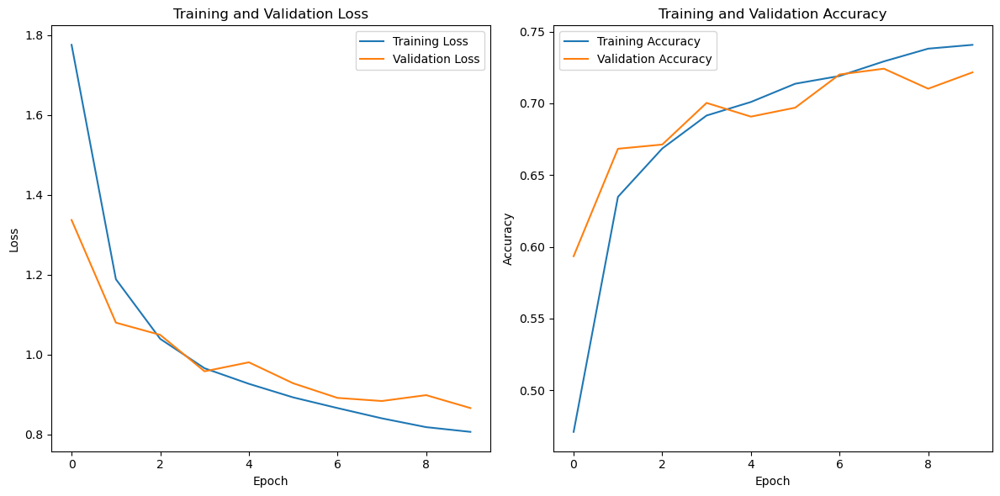

In [50]:
# code block 43
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.legend()
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')

# Plot training and validation accuracy
plt.subplot(1, 2, 2)
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.legend()
plt.title('Training and Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')

plt.tight_layout()
plt.show()

In [51]:
# code block 44
# Evaluate the model on the validation data
val_loss, val_accuracy = model.evaluate(validation_generator)

# Print the validation loss and accuracy
print(f'Validation Loss: {val_loss:.4f}')
print(f'Validation Accuracy: {val_accuracy:.4f}')

43/43 [==============================] - 144s 3s/step - loss: 0.8575 - accuracy: 0.7279
Validation Loss: 0.8575
Validation Accuracy: 0.7279


- It's apparent that the model improves its performance during training, with decreasing loss and increasing accuracy. 
- The final validation accuracy is 72.79%, and the validation loss is 0.8575. This indicates the model's ability to classify flower images, although further fine-tuning or adjustments may be considered for potential improvements.

### Summary:
- In this project, I employed three distinct models to train the flower image classification system and conducted separate analyses of their outcomes. Notably, when applying a common CNN model to the MNIST dataset, an accuracy of 90% was attainable. In contrast, the flower image dataset, characterized by its vibrant and colorful images, yielded  accuracy between 70% to 80%.
- Further investigation into the intricacies of flower features that challenge the models may guide future research and model refinement. Future studies could explore additional architectures, hyperparameter tuning, or ensemble methods to enhance accuracy.
- In conclusion, this research not only provides insights into individual model performances but also highlights the potential for advancements in flower image classification. The implications of this research extend to the development of specialized models contributing to the accurate identification and monitoring of diverse flower species in natural ecosystems. This study lays the groundwork for future research aimed at refining and expanding the applicability of flower image classification models.